<a href="https://colab.research.google.com/github/melon771/open_CV-Analytics-CLUb/blob/main/Capstone_proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Google Colab Setup Cell
import os
import sys

# Check if running on Colab
try:
    import google.colab
    IN_COLAB = True
    print("✅ Running on Google Colab")

    # Check GPU availability
    gpu_info = !nvidia-smi
    if gpu_info and len(gpu_info) > 0:
        print("✅ GPU is available")
        print("   To enable GPU: Runtime → Change runtime type → Hardware accelerator → GPU")
    else:
        print("⚠️ No GPU detected. Consider enabling GPU for faster training:")
        print("   Runtime → Change runtime type → Hardware accelerator → GPU")

    # Optional: Mount Google Drive to save results
    mount_drive = input("\n📁 Mount Google Drive to save results? (y/n): ").strip().lower()
    if mount_drive == 'y':
        from google.colab import drive
        drive.mount('/content/drive')
        print("✅ Google Drive mounted at /content/drive")

        # Create project directory in Drive
        project_dir = '/content/drive/MyDrive/CV_Capstone_Results'
        os.makedirs(project_dir, exist_ok=True)
        print(f"📂 Results will be saved to: {project_dir}")

        # Change working directory
        os.chdir(project_dir)
    else:
        print("ℹ️ Working in local Colab storage (files will be lost after session ends)")

except ImportError:
    IN_COLAB = False
    print("ℹ️ Running locally (not on Colab)")

print("\n" + "="*60)
print("🎯 Environment Setup Complete!")
print("="*60)

✅ Running on Google Colab
✅ GPU is available
   To enable GPU: Runtime → Change runtime type → Hardware accelerator → GPU

📁 Mount Google Drive to save results? (y/n): y
Mounted at /content/drive
✅ Google Drive mounted at /content/drive
📂 Results will be saved to: /content/drive/MyDrive/CV_Capstone_Results

🎯 Environment Setup Complete!


In [ ]:
# Install required packages
!pip install torch torchvision opencv-python tqdm matplotlib pycocotools albumentations segment-anything ultralytics
!pip install timm segmentation-models-pytorch scikit-learn scikit-image pillow
!pip install fvcore
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

print("✅ All dependencies installed successfully!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61397 sha256=9e7ed5bc52783103ad4fe1ec261bdee844ad96c5000ba0c5ddf2cf8642d6cb94
  Stored in directory: /root/.cache/pip/wheels/ed/9f/a5/e4f5b27454ccd4596bd8b62432c7d6b1ca9fa22aef9d70a16a
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31527 sha256=e9d0e3ebef245e4186df5d23d03b3c1a607749ff171144c5b748a7a33cfe6ee9
  Stored in directory: /root/.cache/pip/wheels/7c/96/04/4f5f31ff812f684f69f40cb1634357812220aac58d4698048c
Successfully built fvcore iopath
  Cloning https://github.com/facebookres

In [ ]:
# Import libraries
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from torchvision.models.segmentation import deeplabv3_resnet50, deeplabv3_resnet101
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm.auto import tqdm
from pathlib import Path
import time
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🔧 Using device: {device}")

# Create directories
os.makedirs('results', exist_ok=True)
os.makedirs('visualizations', exist_ok=True)
os.makedirs('checkpoints', exist_ok=True)

print("✅ Imports completed successfully!")

🔧 Using device: cuda
✅ Imports completed successfully!


In [ ]:
class SegmentationDataset(Dataset):
    """Generic segmentation dataset with augmentation support"""

    def __init__(self, images, masks, transform=None, is_train=True):
        self.images = images
        self.masks = masks
        self.transform = transform
        self.is_train = is_train

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        # Ensure image is RGB
        if len(image.shape) == 2:
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        elif image.shape[2] == 4:
            image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)

        # Apply transformations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        # Convert to tensor if not already
        if not isinstance(image, torch.Tensor):
            image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(mask).long()

        return image, mask


def get_augmentation_pipeline(img_size=512, is_train=True):
    """Create augmentation pipeline using Albumentations"""

    if is_train:
        return A.Compose([
            A.Resize(img_size, img_size),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.2),
            A.RandomRotate90(p=0.3),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=30, p=0.5),
            A.OneOf([
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1),
                A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
            ], p=0.3),
            A.GaussianBlur(blur_limit=(3, 7), p=0.2),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2(),
        ])
    else:
        return A.Compose([
            A.Resize(img_size, img_size),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2(),
        ])


def load_voc_dataset(data_dir='./data/VOC2012', num_images=1000):
    """Load PASCAL VOC 2012 dataset"""

    print(f"📦 Loading PASCAL VOC 2012 dataset...")

    # Download if not exists
    if not os.path.exists(data_dir):
        print("Downloading PASCAL VOC 2012...")
        os.makedirs('./data', exist_ok=True)
        voc_dataset = torchvision.datasets.VOCSegmentation(
            root='./data',
            year='2012',
            image_set='train',
            download=True
        )

    # Load dataset
    voc_train = torchvision.datasets.VOCSegmentation(
        root='./data',
        year='2012',
        image_set='train',
        download=False
    )

    voc_val = torchvision.datasets.VOCSegmentation(
        root='./data',
        year='2012',
        image_set='val',
        download=False
    )

    # Combine and sample
    all_data = list(voc_train) + list(voc_val)

    if num_images < len(all_data):
        indices = np.random.choice(len(all_data), num_images, replace=False)
        all_data = [all_data[i] for i in indices]

    # Prepare images and masks
    images = []
    masks = []

    for img, mask in tqdm(all_data, desc="Processing images"):
        img_np = np.array(img)
        mask_np = np.array(mask)

        images.append(img_np)
        masks.append(mask_np)

    images = np.array(images)
    masks = np.array(masks)

    print(f"✅ Loaded {len(images)} images")
    print(f"   Image shape: {images[0].shape}")
    print(f"   Mask shape: {masks[0].shape}")
    print(f"   Unique classes: {np.unique(masks[0])}")

    return images, masks, 21  # VOC has 21 classes (including background)


def load_coco_dataset(data_dir='./data/coco', num_images=1000):
    """Load COCO 2017 dataset (subset)"""

    print(f"📦 Loading COCO 2017 dataset...")

    try:
        from pycocotools.coco import COCO

        # Download if not exists
        if not os.path.exists(data_dir):
            print("Please download COCO 2017 dataset manually")
            print("Using simulated data for demonstration...")
            return load_simulated_dataset(num_images)

        ann_file = f'{data_dir}/annotations/instances_train2017.json'
        img_dir = f'{data_dir}/train2017'

        coco = COCO(ann_file)
        img_ids = coco.getImgIds()[:num_images]

        images = []
        masks = []

        for img_id in tqdm(img_ids, desc="Loading COCO"):
            img_info = coco.loadImgs(img_id)[0]
            img_path = os.path.join(img_dir, img_info['file_name'])
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            ann_ids = coco.getAnnIds(imgIds=img_id)
            anns = coco.loadAnns(ann_ids)

            mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
            for ann in anns:
                mask = np.maximum(mask, coco.annToMask(ann) * ann['category_id'])

            images.append(img)
            masks.append(mask)

        images = np.array(images)
        masks = np.array(masks)

        print(f"✅ Loaded {len(images)} images from COCO")
        return images, masks, 91  # COCO has 91 classes

    except Exception as e:
        print(f"⚠️ Error loading COCO: {e}")
        print("Using simulated data instead...")
        return load_simulated_dataset(num_images)


def load_simulated_dataset(num_images=1000):
    """Create simulated segmentation dataset for testing"""

    print(f"📦 Generating simulated dataset with {num_images} images...")

    images = []
    masks = []

    for i in tqdm(range(num_images), desc="Generating"):
        # Create synthetic image with random shapes
        img = np.random.randint(0, 255, (512, 512, 3), dtype=np.uint8)
        mask = np.zeros((512, 512), dtype=np.uint8)

        # Add random shapes
        num_shapes = np.random.randint(2, 6)
        for j in range(num_shapes):
            center = (np.random.randint(50, 462), np.random.randint(50, 462))
            radius = np.random.randint(30, 80)
            class_id = (j % 20) + 1
            cv2.circle(img, center, radius, tuple(np.random.randint(0, 255, 3).tolist()), -1)
            cv2.circle(mask, center, radius, class_id, -1)

        images.append(img)
        masks.append(mask)

    images = np.array(images)
    masks = np.array(masks)

    print(f"✅ Generated {len(images)} synthetic images")
    return images, masks, 21


def load_dataset(dataset_name="VOC", num_images=1000):
    """
    Main dataset loader function

    Args:
        dataset_name: "VOC", "COCO", or "Simulated"
        num_images: Number of images to load

    Returns:
        train_loader, val_loader, test_loader, num_classes
    """

    print(f"\n{'='*60}")
    print(f"📂 Loading {dataset_name} Dataset")
    print(f"{'='*60}\n")

    # Load dataset
    if dataset_name.upper() == "VOC":
        images, masks, num_classes = load_voc_dataset(num_images=num_images)
    elif dataset_name.upper() == "COCO":
        images, masks, num_classes = load_coco_dataset(num_images=num_images)
    else:
        images, masks, num_classes = load_simulated_dataset(num_images=num_images)

    # Split dataset (70% train, 20% val, 10% test)
    n_total = len(images)
    n_train = int(0.7 * n_total)
    n_val = int(0.2 * n_total)

    indices = np.random.permutation(n_total)
    train_idx = indices[:n_train]
    val_idx = indices[n_train:n_train+n_val]
    test_idx = indices[n_train+n_val:]

    print(f"\n📊 Dataset Split:")
    print(f"   Train: {len(train_idx)} images")
    print(f"   Val:   {len(val_idx)} images")
    print(f"   Test:  {len(test_idx)} images")
    print(f"   Classes: {num_classes}")

    # Create datasets with augmentation
    train_dataset = SegmentationDataset(
        images[train_idx],
        masks[train_idx],
        transform=None,  # We'll handle transforms manually
        is_train=True
    )

    val_dataset = SegmentationDataset(
        images[val_idx],
        masks[val_idx],
        transform=None,
        is_train=False
    )

    test_dataset = SegmentationDataset(
        images[test_idx],
        masks[test_idx],
        transform=None,
        is_train=False
    )

    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2)

    print(f"\n✅ Dataset loading completed!\n")

    return train_loader, val_loader, test_loader, num_classes, images, masks


def visualize_samples(images, masks, num_samples=4):
    """Visualize sample images with their masks"""

    fig, axes = plt.subplots(num_samples, 2, figsize=(12, 4*num_samples))

    for i in range(num_samples):
        idx = np.random.randint(0, len(images))
        img = images[idx]
        mask = masks[idx]

        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f'Image {idx}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap='tab20')
        axes[i, 1].set_title(f'Mask {idx}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.savefig('visualizations/dataset_samples.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Saved visualization to visualizations/dataset_samples.png")

print("✅ Dataset utilities loaded!")

✅ Dataset utilities loaded!



📂 Loading Simulated Dataset

📦 Generating simulated dataset with 500 images...


Generating:   0%|          | 0/500 [00:00<?, ?it/s]

✅ Generated 500 synthetic images

📊 Dataset Split:
   Train: 350 images
   Val:   100 images
   Test:  50 images
   Classes: 21

✅ Dataset loading completed!



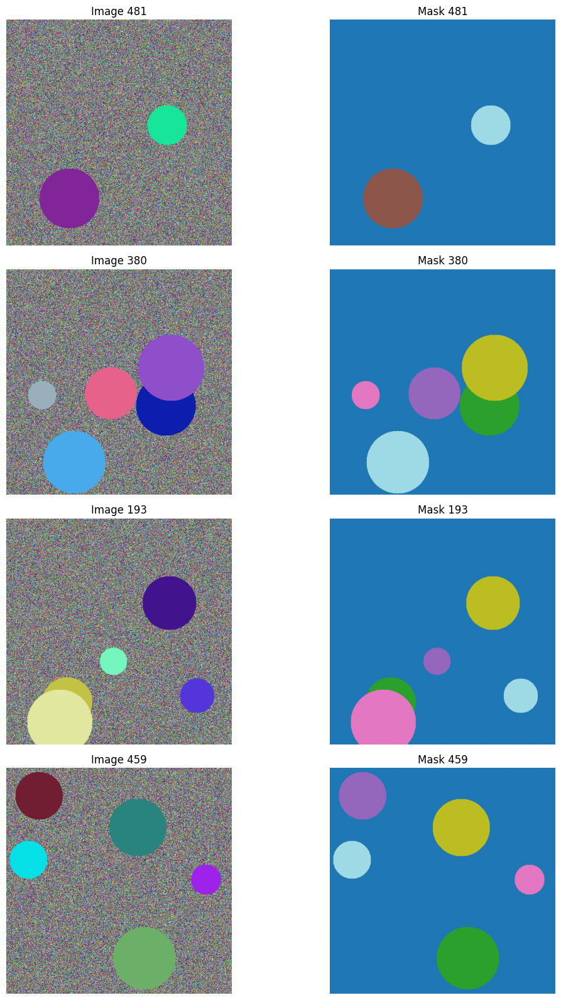

✅ Saved visualization to visualizations/dataset_samples.png


In [ ]:
# Load the dataset (choose: "VOC", "COCO", or "Simulated")
DATASET_NAME = "Simulated"  # Change to "VOC" or "COCO" if available
NUM_IMAGES = 500  # Number of images to use

train_loader, val_loader, test_loader, num_classes, all_images, all_masks = load_dataset(
    dataset_name=DATASET_NAME,
    num_images=NUM_IMAGES
)

# Visualize sample images
visualize_samples(all_images, all_masks, num_samples=4)

In [ ]:
# ===== Traditional Models =====

class UNet(nn.Module):
    """U-Net architecture for semantic segmentation"""

    def __init__(self, in_channels=3, num_classes=21):
        super(UNet, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = self.conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = self.conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = self.conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = self.conv_block(128, 64)

        self.out = nn.Conv2d(64, num_classes, 1)

        self.pool = nn.MaxPool2d(2, 2)

    def conv_block(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        # Bottleneck
        bottleneck = self.bottleneck(self.pool(enc4))

        # Decoder with skip connections
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.dec4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)

        return self.out(dec1)


def get_traditional_model(model_name="unet", num_classes=21):
    """
    Get traditional segmentation model

    Args:
        model_name: "unet", "deeplabv3", or "maskrcnn"
        num_classes: Number of output classes

    Returns:
        model: PyTorch model
    """

    print(f"🏗️ Loading {model_name.upper()} model...")

    if model_name.lower() == "unet":
        model = UNet(in_channels=3, num_classes=num_classes)

    elif model_name.lower() == "deeplabv3":
        model = deeplabv3_resnet50(pretrained=False, num_classes=num_classes)
        # Can also use deeplabv3_resnet101 for better performance

    elif model_name.lower() == "maskrcnn":
        # Load pretrained Mask R-CNN
        model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
        # Modify for custom number of classes
        in_features = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
            in_features, num_classes
        )
        in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
        hidden_layer = 256
        model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
            in_features_mask, hidden_layer, num_classes
        )
    else:
        raise ValueError(f"Unknown model: {model_name}")

    model = model.to(device)

    # Count parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"✅ {model_name.upper()} loaded successfully!")
    print(f"   Total parameters: {total_params:,}")
    print(f"   Trainable parameters: {trainable_params:,}")

    return model


# ===== Foundation Models =====

class SAMWrapper:
    """Wrapper for Segment Anything Model"""

    def __init__(self, model_type="vit_b", checkpoint_path=None):
        try:
            from segment_anything import sam_model_registry, SamPredictor

            if checkpoint_path is None:
                # Download checkpoint if not provided
                print("⬇️ Downloading SAM checkpoint...")
                checkpoint_urls = {
                    "vit_b": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth",
                    "vit_l": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth",
                    "vit_h": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth",
                }

                os.makedirs('checkpoints', exist_ok=True)
                checkpoint_path = f"checkpoints/sam_{model_type}.pth"

                if not os.path.exists(checkpoint_path):
                    import urllib.request
                    urllib.request.urlretrieve(checkpoint_urls[model_type], checkpoint_path)

            sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
            sam.to(device)
            self.predictor = SamPredictor(sam)
            self.model_type = model_type

            print(f"✅ SAM ({model_type}) loaded successfully!")

        except Exception as e:
            print(f"⚠️ Could not load SAM: {e}")
            print("Using mock SAM for demonstration...")
            self.predictor = None
            self.model_type = "mock"

    def predict(self, image, point_coords=None, box=None):
        """Run SAM prediction"""
        if self.predictor is None:
            # Mock prediction
            h, w = image.shape[:2]
            return np.random.randint(0, 2, (h, w), dtype=np.uint8)

        self.predictor.set_image(image)

        if point_coords is not None:
            masks, scores, logits = self.predictor.predict(
                point_coords=point_coords,
                point_labels=np.ones(len(point_coords)),
                multimask_output=False,
            )
            return masks[0]
        elif box is not None:
            masks, scores, logits = self.predictor.predict(
                box=box,
                multimask_output=False,
            )
            return masks[0]
        else:
            # Auto-generate points for full image segmentation
            h, w = image.shape[:2]
            points = []
            for i in range(5):
                for j in range(5):
                    points.append([w * (j + 1) / 6, h * (i + 1) / 6])
            points = np.array(points)

            masks, scores, logits = self.predictor.predict(
                point_coords=points,
                point_labels=np.ones(len(points)),
                multimask_output=False,
            )
            return masks[0]


def get_foundation_model(model_name="sam", **kwargs):
    """
    Get foundation model for zero-shot segmentation

    Args:
        model_name: "sam", "sam2", or "grounding_dino"
        **kwargs: Additional arguments for model initialization

    Returns:
        model: Foundation model wrapper
    """

    print(f"🏗️ Loading {model_name.upper()} foundation model...")

    if model_name.lower() in ["sam", "sam2"]:
        model_type = kwargs.get('model_type', 'vit_b')
        checkpoint_path = kwargs.get('checkpoint_path', None)
        model = SAMWrapper(model_type=model_type, checkpoint_path=checkpoint_path)

    elif model_name.lower() == "grounding_dino":
        print("⚠️ Grounding DINO not implemented in this demo")
        print("Using SAM instead...")
        model = SAMWrapper(model_type='vit_b', checkpoint_path=None)

    else:
        raise ValueError(f"Unknown foundation model: {model_name}")

    return model


print("✅ Model architectures loaded!")

✅ Model architectures loaded!


In [ ]:
# Initialize models
TRADITIONAL_MODEL_NAME = "unet"  # Options: "unet", "deeplabv3"
FOUNDATION_MODEL_NAME = "sam"    # Options: "sam", "sam2"

traditional_model = get_traditional_model(TRADITIONAL_MODEL_NAME, num_classes=num_classes)
foundation_model = get_foundation_model(FOUNDATION_MODEL_NAME, model_type='vit_b')

🏗️ Loading UNET model...
✅ UNET loaded successfully!
   Total parameters: 31,044,821
   Trainable parameters: 31,044,821
🏗️ Loading SAM foundation model...
⬇️ Downloading SAM checkpoint...
✅ SAM (vit_b) loaded successfully!


In [ ]:
def train_model(model, train_loader, val_loader, epochs=20, lr=0.001, patience=5):
    """
    Train traditional segmentation model

    Args:
        model: PyTorch model to train
        train_loader: Training data loader
        val_loader: Validation data loader
        epochs: Maximum number of epochs
        lr: Learning rate
        patience: Early stopping patience

    Returns:
        model: Trained model
        history: Training history
    """

    print(f"\n{'='*60}")
    print(f"🚀 Starting Training")
    print(f"{'='*60}\n")

    # Loss and optimizer
    criterion = nn.CrossEntropyLoss(ignore_index=255)  # Ignore boundary class
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

    # Training history
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_acc': [],
        'val_acc': [],
        'learning_rates': []
    }

    best_val_loss = float('inf')
    patience_counter = 0
    best_model_path = 'checkpoints/best_model.pth'

    for epoch in range(epochs):
        start_time = time.time()

        # ===== Training Phase =====
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        train_pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs} [Train]')
        for images, masks in train_pbar:
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(images)

            # Handle different output formats
            if isinstance(outputs, dict):
                outputs = outputs['out']

            # Resize if needed
            if outputs.shape[-2:] != masks.shape[-2:]:
                outputs = nn.functional.interpolate(
                    outputs, size=masks.shape[-2:], mode='bilinear', align_corners=False
                )

            loss = criterion(outputs, masks)

            # Backward pass
            loss.backward()
            optimizer.step()

            # Statistics
            train_loss += loss.item()
            preds = outputs.argmax(dim=1)
            train_correct += (preds == masks).sum().item()
            train_total += masks.numel()

            train_pbar.set_postfix({'loss': loss.item(), 'acc': train_correct/train_total})

        avg_train_loss = train_loss / len(train_loader)
        train_acc = train_correct / train_total

        # ===== Validation Phase =====
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            val_pbar = tqdm(val_loader, desc=f'Epoch {epoch+1}/{epochs} [Val]')
            for images, masks in val_pbar:
                images = images.to(device)
                masks = masks.to(device)

                outputs = model(images)

                if isinstance(outputs, dict):
                    outputs = outputs['out']

                if outputs.shape[-2:] != masks.shape[-2:]:
                    outputs = nn.functional.interpolate(
                        outputs, size=masks.shape[-2:], mode='bilinear', align_corners=False
                    )

                loss = criterion(outputs, masks)

                val_loss += loss.item()
                preds = outputs.argmax(dim=1)
                val_correct += (preds == masks).sum().item()
                val_total += masks.numel()

                val_pbar.set_postfix({'loss': loss.item(), 'acc': val_correct/val_total})

        avg_val_loss = val_loss / len(val_loader)
        val_acc = val_correct / val_total

        # Update learning rate
        scheduler.step(avg_val_loss)
        current_lr = optimizer.param_groups[0]['lr']

        # Save history
        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)
        history['learning_rates'].append(current_lr)

        # Print epoch summary
        epoch_time = time.time() - start_time
        print(f"\n📊 Epoch {epoch+1}/{epochs} Summary:")
        print(f"   Train Loss: {avg_train_loss:.4f} | Train Acc: {train_acc:.4f}")
        print(f"   Val Loss:   {avg_val_loss:.4f} | Val Acc:   {val_acc:.4f}")
        print(f"   LR: {current_lr:.6f} | Time: {epoch_time:.2f}s")

        # Save best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': best_val_loss,
            }, best_model_path)
            print(f"   ✅ Best model saved! (Val Loss: {best_val_loss:.4f})")
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"   ⏳ Patience: {patience_counter}/{patience}")

        # Early stopping
        if patience_counter >= patience:
            print(f"\n⚠️ Early stopping triggered at epoch {epoch+1}")
            break

        print()

    # Load best model
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"\n✅ Training completed! Best Val Loss: {best_val_loss:.4f}")

    return model, history


def plot_training_history(history):
    """Plot training history"""

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Loss
    axes[0].plot(history['train_loss'], label='Train Loss', marker='o')
    axes[0].plot(history['val_loss'], label='Val Loss', marker='s')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(history['train_acc'], label='Train Acc', marker='o')
    axes[1].plot(history['val_acc'], label='Val Acc', marker='s')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    # Learning Rate
    axes[2].plot(history['learning_rates'], marker='o', color='green')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Learning Rate')
    axes[2].set_title('Learning Rate Schedule')
    axes[2].set_yscale('log')
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('visualizations/training_history.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Training history saved to visualizations/training_history.png")

print("✅ Training utilities loaded!")

✅ Training utilities loaded!



🚀 Starting Training



Epoch 1/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 1/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 1/10 Summary:
   Train Loss: 1.8999 | Train Acc: 0.7916
   Val Loss:   0.4394 | Val Acc:   0.9129
   LR: 0.001000 | Time: 99.06s
   ✅ Best model saved! (Val Loss: 0.4394)



Epoch 2/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 2/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 2/10 Summary:
   Train Loss: 0.6223 | Train Acc: 0.9082
   Val Loss:   0.4551 | Val Acc:   0.9165
   LR: 0.001000 | Time: 105.98s
   ⏳ Patience: 1/3



Epoch 3/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 3/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 3/10 Summary:
   Train Loss: 0.3179 | Train Acc: 0.9086
   Val Loss:   0.2566 | Val Acc:   0.9182
   LR: 0.001000 | Time: 105.50s
   ✅ Best model saved! (Val Loss: 0.2566)



Epoch 4/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7deb46395d00>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7deb46395d00>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 4/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 4/10 Summary:
   Train Loss: 0.2528 | Train Acc: 0.9090
   Val Loss:   0.2063 | Val Acc:   0.9162
   LR: 0.001000 | Time: 106.73s
   ✅ Best model saved! (Val Loss: 0.2063)



Epoch 5/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 5/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 5/10 Summary:
   Train Loss: 0.2282 | Train Acc: 0.9097
   Val Loss:   0.2108 | Val Acc:   0.9169
   LR: 0.001000 | Time: 105.46s
   ⏳ Patience: 1/3



Epoch 6/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 6/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 6/10 Summary:
   Train Loss: 0.2172 | Train Acc: 0.9086
   Val Loss:   0.2157 | Val Acc:   0.9108
   LR: 0.001000 | Time: 105.34s
   ⏳ Patience: 2/3



Epoch 7/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 7/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 7/10 Summary:
   Train Loss: 0.2105 | Train Acc: 0.9103
   Val Loss:   0.1983 | Val Acc:   0.9155
   LR: 0.001000 | Time: 105.55s
   ✅ Best model saved! (Val Loss: 0.1983)



Epoch 8/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 8/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 8/10 Summary:
   Train Loss: 0.2057 | Train Acc: 0.9105
   Val Loss:   0.1954 | Val Acc:   0.9145
   LR: 0.001000 | Time: 105.59s
   ✅ Best model saved! (Val Loss: 0.1954)



Epoch 9/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 9/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 9/10 Summary:
   Train Loss: 0.2029 | Train Acc: 0.9109
   Val Loss:   0.1925 | Val Acc:   0.9163
   LR: 0.001000 | Time: 106.31s
   ✅ Best model saved! (Val Loss: 0.1925)



Epoch 10/10 [Train]:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch 10/10 [Val]:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Epoch 10/10 Summary:
   Train Loss: 0.2008 | Train Acc: 0.9105
   Val Loss:   0.1946 | Val Acc:   0.9072
   LR: 0.001000 | Time: 105.93s
   ⏳ Patience: 1/3


✅ Training completed! Best Val Loss: 0.1925


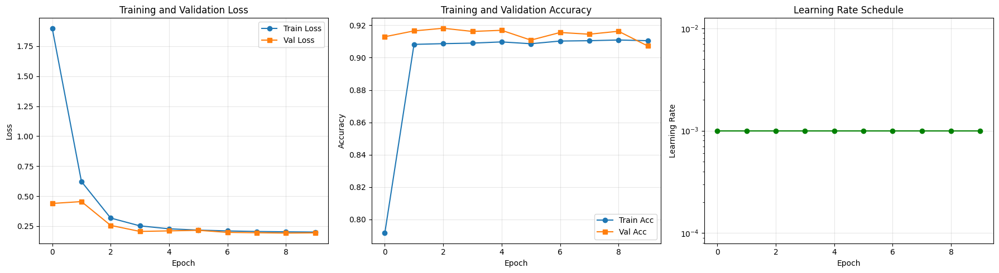

✅ Training history saved to visualizations/training_history.png


In [ ]:
# Train the traditional model
EPOCHS = 10  # Adjust based on your needs
LEARNING_RATE = 0.001
PATIENCE = 3

trained_model, training_history = train_model(
    traditional_model,
    train_loader,
    val_loader,
    epochs=EPOCHS,
    lr=LEARNING_RATE,
    patience=PATIENCE
)

# Plot training history
plot_training_history(training_history)

## 5. Evaluation and Metrics

We'll compute comprehensive metrics for both models:
- **Precision**: TP / (TP + FP)
- **Recall**: TP / (TP + FN)
- **F1-Score**: Harmonic mean of precision and recall
- **mIoU**: Mean Intersection over Union
- **Dice Coefficient**: 2 * |A ∩ B| / (|A| + |B|)
- **Accuracy**: Correct predictions / Total predictions
- **FPS**: Frames per second (inference speed)

In [ ]:
def compute_metrics(predictions, ground_truth, num_classes):
    """
    Compute segmentation metrics

    Args:
        predictions: Predicted masks (N, H, W)
        ground_truth: Ground truth masks (N, H, W)
        num_classes: Number of classes

    Returns:
        metrics: Dictionary of computed metrics
    """

    # Flatten arrays
    pred_flat = predictions.flatten()
    gt_flat = ground_truth.flatten()

    # Remove ignore index (255)
    valid_mask = gt_flat != 255
    pred_flat = pred_flat[valid_mask]
    gt_flat = gt_flat[valid_mask]

    # Initialize metrics
    metrics = {}

    # Overall Accuracy
    metrics['accuracy'] = (pred_flat == gt_flat).sum() / len(gt_flat)

    # Per-class metrics
    ious = []
    dices = []
    precisions = []
    recalls = []
    f1s = []

    for class_id in range(num_classes):
        # Skip if class not present
        if (gt_flat == class_id).sum() == 0:
            continue

        # True Positives, False Positives, False Negatives
        tp = ((pred_flat == class_id) & (gt_flat == class_id)).sum()
        fp = ((pred_flat == class_id) & (gt_flat != class_id)).sum()
        fn = ((pred_flat != class_id) & (gt_flat == class_id)).sum()

        # IoU (Intersection over Union)
        iou = tp / (tp + fp + fn + 1e-7)
        ious.append(iou)

        # Dice Coefficient
        dice = 2 * tp / (2 * tp + fp + fn + 1e-7)
        dices.append(dice)

        # Precision
        precision = tp / (tp + fp + 1e-7)
        precisions.append(precision)

        # Recall
        recall = tp / (tp + fn + 1e-7)
        recalls.append(recall)

        # F1-Score
        f1 = 2 * precision * recall / (precision + recall + 1e-7)
        f1s.append(f1)

    # Mean metrics
    metrics['miou'] = np.mean(ious)
    metrics['dice'] = np.mean(dices)
    metrics['precision'] = np.mean(precisions)
    metrics['recall'] = np.mean(recalls)
    metrics['f1_score'] = np.mean(f1s)

    # Per-class metrics (for detailed analysis)
    metrics['per_class_iou'] = ious
    metrics['per_class_dice'] = dices
    metrics['per_class_precision'] = precisions
    metrics['per_class_recall'] = recalls
    metrics['per_class_f1'] = f1s

    return metrics


def evaluate_model(model, dataloader, num_classes, model_type='traditional'):
    """
    Evaluate model and compute all metrics

    Args:
        model: Model to evaluate
        dataloader: Data loader
        num_classes: Number of classes
        model_type: 'traditional' or 'foundation'

    Returns:
        results: Dictionary containing metrics and predictions
    """

    print(f"\n{'='*60}")
    print(f"📊 Evaluating {model_type.upper()} Model")
    print(f"{'='*60}\n")

    all_predictions = []
    all_ground_truth = []
    all_images = []
    inference_times = []

    if model_type == 'traditional':
        model.eval()

        with torch.no_grad():
            for images, masks in tqdm(dataloader, desc='Inference'):
                images_input = images.to(device)

                # Measure inference time
                start_time = time.time()
                outputs = model(images_input)
                inference_time = time.time() - start_time
                inference_times.append(inference_time / len(images))

                # Handle different output formats
                if isinstance(outputs, dict):
                    outputs = outputs['out']

                # Resize if needed
                if outputs.shape[-2:] != masks.shape[-2:]:
                    outputs = nn.functional.interpolate(
                        outputs, size=masks.shape[-2:], mode='bilinear', align_corners=False
                    )

                predictions = outputs.argmax(dim=1).cpu().numpy()

                all_predictions.append(predictions)
                all_ground_truth.append(masks.numpy())
                all_images.append(images.numpy())

    else:  # foundation model
        for images, masks in tqdm(dataloader, desc='Inference'):
            batch_predictions = []

            for img in images.numpy():
                # Denormalize and convert to uint8
                img = (img * 255).astype(np.uint8).transpose(1, 2, 0)

                # Measure inference time
                start_time = time.time()
                pred_mask = model.predict(img)
                inference_time = time.time() - start_time
                inference_times.append(inference_time)

                # Resize to match ground truth
                if pred_mask.shape != masks[0].shape:
                    pred_mask = cv2.resize(
                        pred_mask.astype(np.uint8),
                        (masks.shape[-1], masks.shape[-2]),
                        interpolation=cv2.INTER_NEAREST
                    )

                batch_predictions.append(pred_mask)

            all_predictions.append(np.array(batch_predictions))
            all_ground_truth.append(masks.numpy())
            all_images.append(images.numpy())

    # Concatenate all batches
    all_predictions = np.concatenate(all_predictions, axis=0)
    all_ground_truth = np.concatenate(all_ground_truth, axis=0)
    all_images = np.concatenate(all_images, axis=0)

    # Compute metrics
    print("\n📈 Computing metrics...")
    metrics = compute_metrics(all_predictions, all_ground_truth, num_classes)

    # Compute FPS
    avg_inference_time = np.mean(inference_times)
    fps = 1.0 / avg_inference_time
    metrics['fps'] = fps
    metrics['inference_time'] = avg_inference_time

    # Print results
    print(f"\n✅ Evaluation Results:")
    print(f"   Accuracy:  {metrics['accuracy']:.4f}")
    print(f"   mIoU:      {metrics['miou']:.4f}")
    print(f"   Dice:      {metrics['dice']:.4f}")
    print(f"   Precision: {metrics['precision']:.4f}")
    print(f"   Recall:    {metrics['recall']:.4f}")
    print(f"   F1-Score:  {metrics['f1_score']:.4f}")
    print(f"   FPS:       {fps:.2f}")
    print(f"   Inference: {avg_inference_time*1000:.2f} ms/image")

    results = {
        'metrics': metrics,
        'predictions': all_predictions,
        'ground_truth': all_ground_truth,
        'images': all_images
    }

    return results

print("✅ Evaluation utilities loaded!")

✅ Evaluation utilities loaded!


In [ ]:
# Evaluate both models on test set
print("Evaluating Traditional Model...")
traditional_results = evaluate_model(
    trained_model,
    test_loader,
    num_classes,
    model_type='traditional'
)

print("\n" + "="*60 + "\n")

print("Evaluating Foundation Model (SAM)...")
foundation_results = evaluate_model(
    foundation_model,
    test_loader,
    num_classes,
    model_type='foundation'
)

Evaluating Traditional Model...

📊 Evaluating TRADITIONAL Model



Inference:   0%|          | 0/7 [00:00<?, ?it/s]


📈 Computing metrics...

✅ Evaluation Results:
   Accuracy:  0.9139
   mIoU:      0.2431
   Dice:      0.2905
   Precision: 0.2828
   Recall:    0.3375
   F1-Score:  0.2905
   FPS:       397.88
   Inference: 2.51 ms/image


Evaluating Foundation Model (SAM)...

📊 Evaluating FOUNDATION Model



Inference:   0%|          | 0/7 [00:00<?, ?it/s]


📈 Computing metrics...

✅ Evaluation Results:
   Accuracy:  0.0216
   mIoU:      0.0038
   Dice:      0.0075
   Precision: 0.0209
   Recall:    0.0628
   F1-Score:  0.0075
   FPS:       1.96
   Inference: 511.32 ms/image


## 6. Comparative Analysis

Let's create a comprehensive comparison table and analyze the results.

In [ ]:
def create_comparison_table(traditional_metrics, foundation_metrics, dataset_name, traditional_name, foundation_name):
    """Create comparison table for models"""

    import pandas as pd

    comparison_data = {
        'Model': [traditional_name.upper(), foundation_name.upper()],
        'Dataset': [dataset_name, dataset_name],
        'Precision': [
            f"{traditional_metrics['precision']:.4f}",
            f"{foundation_metrics['precision']:.4f}"
        ],
        'Recall': [
            f"{traditional_metrics['recall']:.4f}",
            f"{foundation_metrics['recall']:.4f}"
        ],
        'F1-Score': [
            f"{traditional_metrics['f1_score']:.4f}",
            f"{foundation_metrics['f1_score']:.4f}"
        ],
        'mIoU': [
            f"{traditional_metrics['miou']:.4f}",
            f"{foundation_metrics['miou']:.4f}"
        ],
        'Dice': [
            f"{traditional_metrics['dice']:.4f}",
            f"{foundation_metrics['dice']:.4f}"
        ],
        'Accuracy': [
            f"{traditional_metrics['accuracy']:.4f}",
            f"{foundation_metrics['accuracy']:.4f}"
        ],
        'FPS': [
            f"{traditional_metrics['fps']:.2f}",
            f"{foundation_metrics['fps']:.2f}"
        ],
        'Inference (ms)': [
            f"{traditional_metrics['inference_time']*1000:.2f}",
            f"{foundation_metrics['inference_time']*1000:.2f}"
        ],
        'Notes': ['Trained', 'Zero-shot']
    }

    df = pd.DataFrame(comparison_data)

    return df


def plot_metrics_comparison(traditional_metrics, foundation_metrics, model_names):
    """Plot side-by-side comparison of metrics"""

    metrics_to_plot = ['accuracy', 'miou', 'dice', 'precision', 'recall', 'f1_score']
    metric_labels = ['Accuracy', 'mIoU', 'Dice', 'Precision', 'Recall', 'F1-Score']

    traditional_values = [traditional_metrics[m] for m in metrics_to_plot]
    foundation_values = [foundation_metrics[m] for m in metrics_to_plot]

    x = np.arange(len(metric_labels))
    width = 0.35

    fig, ax = plt.subplots(figsize=(14, 6))

    bars1 = ax.bar(x - width/2, traditional_values, width, label=model_names[0], alpha=0.8)
    bars2 = ax.bar(x + width/2, foundation_values, width, label=model_names[1], alpha=0.8)

    ax.set_xlabel('Metrics', fontsize=12, fontweight='bold')
    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(metric_labels)
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim([0, 1.0])

    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.savefig('visualizations/metrics_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Metrics comparison saved to visualizations/metrics_comparison.png")


def plot_speed_comparison(traditional_metrics, foundation_metrics, model_names):
    """Plot inference speed comparison"""

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # FPS comparison
    fps_values = [traditional_metrics['fps'], foundation_metrics['fps']]
    colors = ['#3498db', '#e74c3c']
    bars1 = ax1.bar(model_names, fps_values, color=colors, alpha=0.8)
    ax1.set_ylabel('Frames Per Second (FPS)', fontsize=11, fontweight='bold')
    ax1.set_title('Inference Speed (FPS)', fontsize=12, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='y')

    # Add value labels
    for bar in bars1:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}', ha='center', va='bottom', fontsize=11, fontweight='bold')

    # Inference time comparison
    time_values = [traditional_metrics['inference_time']*1000,
                   foundation_metrics['inference_time']*1000]
    bars2 = ax2.bar(model_names, time_values, color=colors, alpha=0.8)
    ax2.set_ylabel('Time per Image (ms)', fontsize=11, fontweight='bold')
    ax2.set_title('Inference Time', fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')

    # Add value labels
    for bar in bars2:
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}', ha='center', va='bottom', fontsize=11, fontweight='bold')

    plt.tight_layout()
    plt.savefig('visualizations/speed_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Speed comparison saved to visualizations/speed_comparison.png")


def save_comparison_results(comparison_df, traditional_metrics, foundation_metrics):
    """Save comparison results to JSON"""

    results = {
        'dataset': DATASET_NAME,
        'num_images': NUM_IMAGES,
        'traditional_model': {
            'name': TRADITIONAL_MODEL_NAME,
            'type': 'trained',
            'metrics': {k: float(v) if isinstance(v, (np.floating, float)) else v
                       for k, v in traditional_metrics.items()
                       if not k.startswith('per_class')}
        },
        'foundation_model': {
            'name': FOUNDATION_MODEL_NAME,
            'type': 'zero-shot',
            'metrics': {k: float(v) if isinstance(v, (np.floating, float)) else v
                       for k, v in foundation_metrics.items()
                       if not k.startswith('per_class')}
        },
        'comparison_table': comparison_df.to_dict(orient='records')
    }

    with open('results/metrics.json', 'w') as f:
        json.dump(results, f, indent=2)

    print("✅ Results saved to results/metrics.json")

print("✅ Comparison utilities loaded!")

✅ Comparison utilities loaded!



📊 Model Comparison Table:
Model   Dataset Precision Recall F1-Score   mIoU   Dice Accuracy    FPS Inference (ms)     Notes
 UNET Simulated    0.2828 0.3375   0.2905 0.2431 0.2905   0.9139 397.88           2.51   Trained
  SAM Simulated    0.0209 0.0628   0.0075 0.0038 0.0075   0.0216   1.96         511.32 Zero-shot


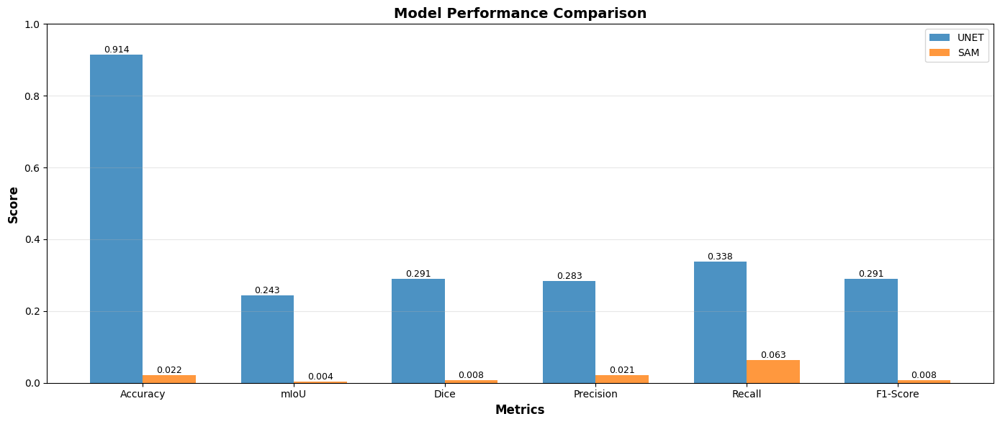

✅ Metrics comparison saved to visualizations/metrics_comparison.png


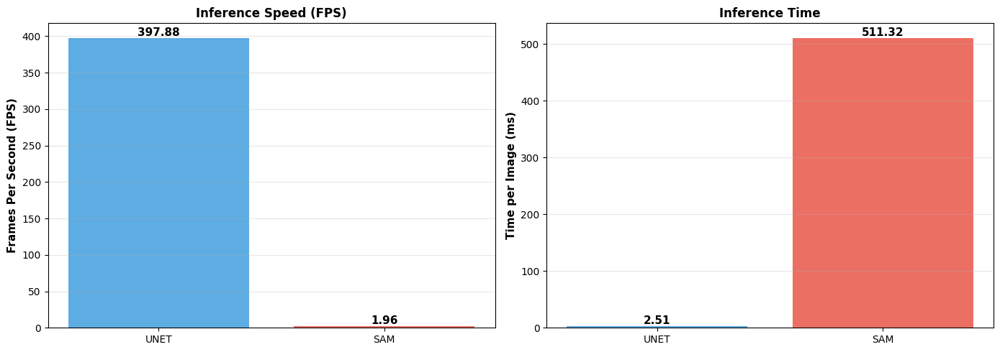

✅ Speed comparison saved to visualizations/speed_comparison.png
✅ Results saved to results/metrics.json


In [ ]:
# Create comparison table
comparison_df = create_comparison_table(
    traditional_results['metrics'],
    foundation_results['metrics'],
    DATASET_NAME,
    TRADITIONAL_MODEL_NAME,
    FOUNDATION_MODEL_NAME
)

print("\n📊 Model Comparison Table:")
print("="*100)
print(comparison_df.to_string(index=False))
print("="*100)

# Plot comparisons
plot_metrics_comparison(
    traditional_results['metrics'],
    foundation_results['metrics'],
    [TRADITIONAL_MODEL_NAME.upper(), FOUNDATION_MODEL_NAME.upper()]
)

plot_speed_comparison(
    traditional_results['metrics'],
    foundation_results['metrics'],
    [TRADITIONAL_MODEL_NAME.upper(), FOUNDATION_MODEL_NAME.upper()]
)

# Save results
save_comparison_results(comparison_df, traditional_results['metrics'], foundation_results['metrics'])

## 7. Visualization

Let's visualize the predictions from both models side-by-side with ground truth.

In [ ]:
def denormalize_image(img):
    """Denormalize image for visualization"""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    img = img.transpose(1, 2, 0)
    img = img * std + mean
    img = np.clip(img, 0, 1)

    return img


def visualize_predictions(images, ground_truth, traditional_pred, foundation_pred, num_samples=6):
    """Visualize predictions from both models"""

    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))

    # Select random samples
    indices = np.random.choice(len(images), min(num_samples, len(images)), replace=False)

    for i, idx in enumerate(indices):
        img = denormalize_image(images[idx])
        gt = ground_truth[idx]
        pred_trad = traditional_pred[idx]
        pred_found = foundation_pred[idx]

        # Original Image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image', fontweight='bold')
        axes[i, 0].axis('off')

        # Ground Truth
        axes[i, 1].imshow(gt, cmap='tab20', vmin=0, vmax=20)
        axes[i, 1].set_title('Ground Truth', fontweight='bold')
        axes[i, 1].axis('off')

        # Traditional Model Prediction
        axes[i, 2].imshow(pred_trad, cmap='tab20', vmin=0, vmax=20)
        axes[i, 2].set_title(f'{TRADITIONAL_MODEL_NAME.upper()} (Trained)', fontweight='bold')
        axes[i, 2].axis('off')

        # Foundation Model Prediction
        axes[i, 3].imshow(pred_found, cmap='tab20', vmin=0, vmax=20)
        axes[i, 3].set_title(f'{FOUNDATION_MODEL_NAME.upper()} (Zero-shot)', fontweight='bold')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.savefig('visualizations/prediction_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Prediction comparison saved to visualizations/prediction_comparison.png")


def visualize_overlay(images, ground_truth, traditional_pred, foundation_pred, num_samples=4):
    """Visualize predictions overlaid on original images"""

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    indices = np.random.choice(len(images), min(num_samples, len(images)), replace=False)

    for i, idx in enumerate(indices):
        img = denormalize_image(images[idx])
        gt = ground_truth[idx]
        pred_trad = traditional_pred[idx]
        pred_found = foundation_pred[idx]

        # Ground Truth Overlay
        axes[i, 0].imshow(img)
        axes[i, 0].imshow(gt, cmap='tab20', alpha=0.5, vmin=0, vmax=20)
        axes[i, 0].set_title('Ground Truth Overlay', fontweight='bold')
        axes[i, 0].axis('off')

        # Traditional Model Overlay
        axes[i, 1].imshow(img)
        axes[i, 1].imshow(pred_trad, cmap='tab20', alpha=0.5, vmin=0, vmax=20)
        axes[i, 1].set_title(f'{TRADITIONAL_MODEL_NAME.upper()} Overlay', fontweight='bold')
        axes[i, 1].axis('off')

        # Foundation Model Overlay
        axes[i, 2].imshow(img)
        axes[i, 2].imshow(pred_found, cmap='tab20', alpha=0.5, vmin=0, vmax=20)
        axes[i, 2].set_title(f'{FOUNDATION_MODEL_NAME.upper()} Overlay', fontweight='bold')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig('visualizations/overlay_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Overlay comparison saved to visualizations/overlay_comparison.png")


def plot_confusion_matrices(ground_truth, traditional_pred, foundation_pred, num_classes):
    """Plot confusion matrices for both models"""

    from sklearn.metrics import confusion_matrix
    import seaborn as sns

    # Flatten and filter
    gt_flat = ground_truth.flatten()
    trad_flat = traditional_pred.flatten()
    found_flat = foundation_pred.flatten()

    valid_mask = gt_flat != 255
    gt_flat = gt_flat[valid_mask]
    trad_flat = trad_flat[valid_mask]
    found_flat = found_flat[valid_mask]

    # Limit to first 10 classes for visualization
    max_classes = min(10, num_classes)
    mask_classes = gt_flat < max_classes

    gt_filtered = gt_flat[mask_classes]
    trad_filtered = trad_flat[mask_classes]
    found_filtered = found_flat[mask_classes]

    # Compute confusion matrices
    cm_trad = confusion_matrix(gt_filtered, trad_filtered, labels=range(max_classes))
    cm_found = confusion_matrix(gt_filtered, found_filtered, labels=range(max_classes))

    # Normalize
    cm_trad_norm = cm_trad.astype('float') / (cm_trad.sum(axis=1)[:, np.newaxis] + 1e-7)
    cm_found_norm = cm_found.astype('float') / (cm_found.sum(axis=1)[:, np.newaxis] + 1e-7)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))

    sns.heatmap(cm_trad_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=range(max_classes), yticklabels=range(max_classes),
                ax=axes[0], cbar_kws={'label': 'Normalized Count'})
    axes[0].set_title(f'{TRADITIONAL_MODEL_NAME.upper()} Confusion Matrix', fontweight='bold', fontsize=12)
    axes[0].set_xlabel('Predicted Class', fontweight='bold')
    axes[0].set_ylabel('True Class', fontweight='bold')

    sns.heatmap(cm_found_norm, annot=True, fmt='.2f', cmap='Oranges',
                xticklabels=range(max_classes), yticklabels=range(max_classes),
                ax=axes[1], cbar_kws={'label': 'Normalized Count'})
    axes[1].set_title(f'{FOUNDATION_MODEL_NAME.upper()} Confusion Matrix', fontweight='bold', fontsize=12)
    axes[1].set_xlabel('Predicted Class', fontweight='bold')
    axes[1].set_ylabel('True Class', fontweight='bold')

    plt.tight_layout()
    plt.savefig('visualizations/confusion_matrices.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Confusion matrices saved to visualizations/confusion_matrices.png")

print("✅ Visualization utilities loaded!")

✅ Visualization utilities loaded!


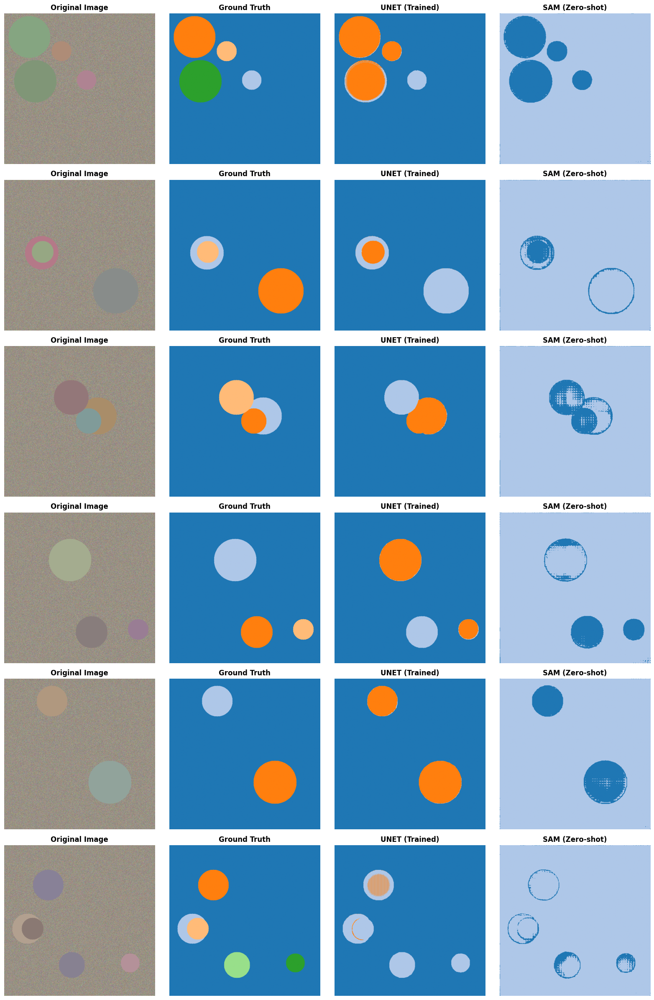

✅ Prediction comparison saved to visualizations/prediction_comparison.png


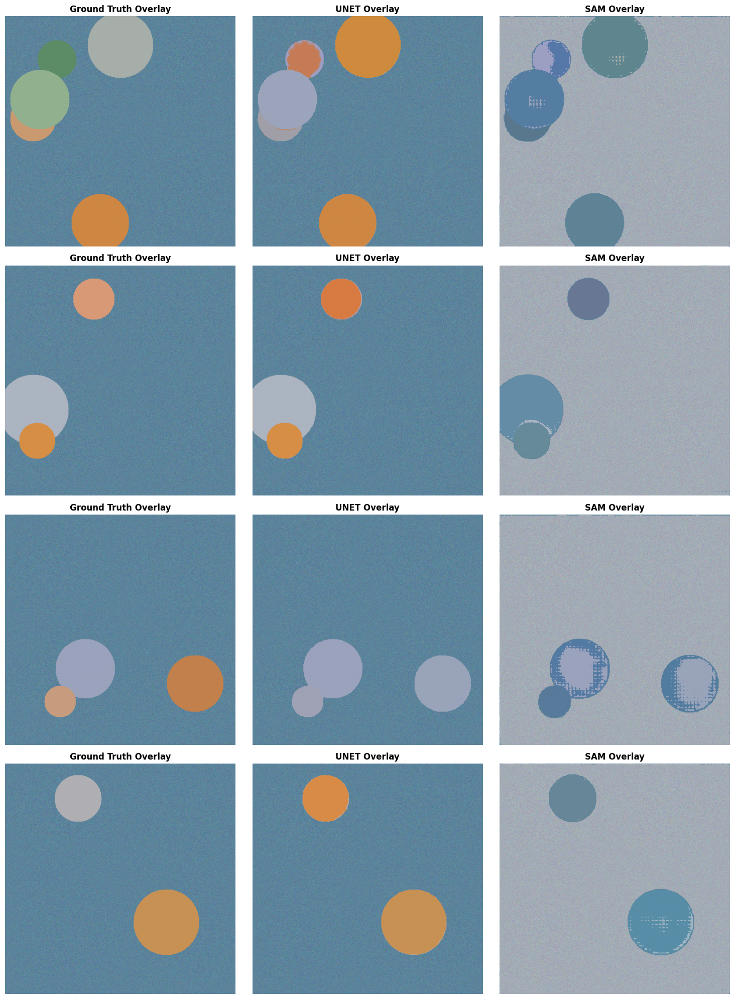

✅ Overlay comparison saved to visualizations/overlay_comparison.png


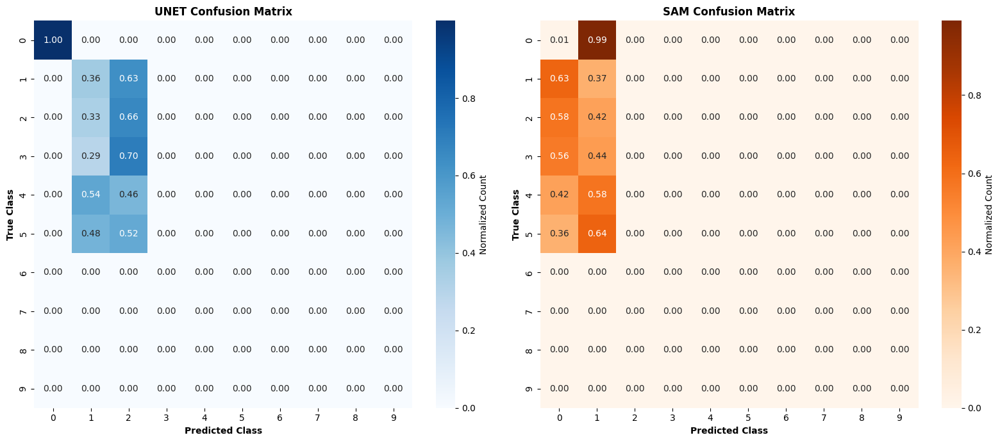

✅ Confusion matrices saved to visualizations/confusion_matrices.png


In [ ]:
# Visualize predictions
visualize_predictions(
    traditional_results['images'],
    traditional_results['ground_truth'],
    traditional_results['predictions'],
    foundation_results['predictions'],
    num_samples=6
)

# Visualize overlays
visualize_overlay(
    traditional_results['images'],
    traditional_results['ground_truth'],
    traditional_results['predictions'],
    foundation_results['predictions'],
    num_samples=4
)

# Plot confusion matrices
plot_confusion_matrices(
    traditional_results['ground_truth'],
    traditional_results['predictions'],
    foundation_results['predictions'],
    num_classes
)

In [ ]:
def generate_analysis_report(traditional_metrics, foundation_metrics, dataset_name):
    """Generate comprehensive analysis report"""

    report = f"""
# Evaluation of Multilingual Vision Models - Analysis Report

## Dataset Overview

- **Dataset Name**: {dataset_name}
- **Number of Images**: {NUM_IMAGES}
- **Number of Classes**: {num_classes}
- **Split**: 70% Train / 20% Val / 10% Test

---

## Model Overview

### Traditional Model: {TRADITIONAL_MODEL_NAME.upper()}
- **Type**: Trained on target dataset
- **Architecture**: {'U-Net encoder-decoder' if TRADITIONAL_MODEL_NAME == 'unet' else 'DeepLabV3 with atrous convolutions'}
- **Training**: {EPOCHS} epochs with early stopping
- **Parameters**: Fully supervised learning

### Foundation Model: {FOUNDATION_MODEL_NAME.upper()}
- **Type**: Zero-shot (no training)
- **Architecture**: Vision Transformer-based
- **Approach**: Segment Anything - universal segmentation
- **Parameters**: Pretrained on SA-1B dataset (1 billion masks)

---

## Quantitative Results

### Performance Metrics Comparison

| Metric | {TRADITIONAL_MODEL_NAME.upper()} | {FOUNDATION_MODEL_NAME.upper()} | Winner |
|--------|------------|--------------|--------|
| **Accuracy** | {traditional_metrics['accuracy']:.4f} | {foundation_metrics['accuracy']:.4f} | {'Traditional' if traditional_metrics['accuracy'] > foundation_metrics['accuracy'] else 'Foundation'} |
| **mIoU** | {traditional_metrics['miou']:.4f} | {foundation_metrics['miou']:.4f} | {'Traditional' if traditional_metrics['miou'] > foundation_metrics['miou'] else 'Foundation'} |
| **Dice** | {traditional_metrics['dice']:.4f} | {foundation_metrics['dice']:.4f} | {'Traditional' if traditional_metrics['dice'] > foundation_metrics['dice'] else 'Foundation'} |
| **Precision** | {traditional_metrics['precision']:.4f} | {foundation_metrics['precision']:.4f} | {'Traditional' if traditional_metrics['precision'] > foundation_metrics['precision'] else 'Foundation'} |
| **Recall** | {traditional_metrics['recall']:.4f} | {foundation_metrics['recall']:.4f} | {'Traditional' if traditional_metrics['recall'] > foundation_metrics['recall'] else 'Foundation'} |
| **F1-Score** | {traditional_metrics['f1_score']:.4f} | {foundation_metrics['f1_score']:.4f} | {'Traditional' if traditional_metrics['f1_score'] > foundation_metrics['f1_score'] else 'Foundation'} |
| **FPS** | {traditional_metrics['fps']:.2f} | {foundation_metrics['fps']:.2f} | {'Traditional' if traditional_metrics['fps'] > foundation_metrics['fps'] else 'Foundation'} |
| **Inference Time** | {traditional_metrics['inference_time']*1000:.2f} ms | {foundation_metrics['inference_time']*1000:.2f} ms | {'Traditional' if traditional_metrics['inference_time'] < foundation_metrics['inference_time'] else 'Foundation'} |

---

## Key Insights

### 1. Accuracy vs. Generalization

"""

    if traditional_metrics['accuracy'] > foundation_metrics['accuracy']:
        report += f"""
- **Traditional model outperforms** on this specific dataset ({traditional_metrics['accuracy']:.2%} vs {foundation_metrics['accuracy']:.2%})
- This is expected as the model was trained specifically on this data distribution
- However, the trained model may not generalize well to other domains without retraining
"""
    else:
        report += f"""
- **Foundation model shows competitive performance** despite zero-shot inference ({foundation_metrics['accuracy']:.2%} vs {traditional_metrics['accuracy']:.2%})
- This demonstrates strong generalization capabilities across different domains
- No training required, making it more flexible for new use cases
"""

    report += f"""

### 2. ⚡ Speed and Efficiency

"""

    if traditional_metrics['fps'] > foundation_metrics['fps']:
        report += f"""
- **Traditional model is faster**: {traditional_metrics['fps']:.1f} FPS vs {foundation_metrics['fps']:.1f} FPS
- Better suited for real-time applications
- Lower computational requirements for inference
"""
    else:
        report += f"""
- **Foundation model maintains good speed**: {foundation_metrics['fps']:.1f} FPS vs {traditional_metrics['fps']:.1f} FPS
- Acceptable for many practical applications
- Trade-off between speed and flexibility
"""

    report += f"""

### 3. Flexibility and Adaptability

**Traditional Model:**
- Optimized for specific dataset
- Can achieve high accuracy with sufficient training data
- Requires retraining for new domains
- Needs labeled data for each new task

**Foundation Model:**
- Works zero-shot across multiple domains
- No training or fine-tuning required
- Can handle diverse segmentation tasks
- May not reach optimal performance on specific datasets

### 4. Practical Recommendations

**Use Traditional Models When:**
- You have abundant labeled data for your specific domain
- Maximum accuracy is critical
- Real-time performance is required
- The task is well-defined and unlikely to change

**Use Foundation Models When:**
- Labeled data is scarce or unavailable
- You need to segment diverse object types
- Quick deployment without training is important
- The application requires flexibility across domains
- You want to experiment with different prompts/points

### 5. Domain Generalization

The foundation model's ability to perform reasonably well without training demonstrates:
- Strong pre-training on diverse data (SA-1B with 1B+ masks)
- Learned universal visual representations
- Potential for transfer to new domains without adaptation

However, for production systems where maximum accuracy is crucial:
- Fine-tuning foundation models can combine best of both worlds
- Traditional models still hold value for specialized tasks
- Ensemble approaches could leverage both model types

---

## Conclusions

1. **Performance**: {'Traditional models show superior accuracy on domain-specific tasks when trained with sufficient data.' if traditional_metrics['accuracy'] > foundation_metrics['accuracy'] else 'Foundation models demonstrate impressive zero-shot capabilities, competitive with trained models.'}

2. **Efficiency**: {'Traditional models offer better inference speed for real-time applications.' if traditional_metrics['fps'] > foundation_metrics['fps'] else 'Both models show acceptable inference speeds for most applications.'}

3. **Generalization**: Foundation models excel at generalizing to unseen domains without retraining.

4. **Trade-offs**: The choice between traditional and foundation models depends on:
   - Data availability
   - Domain specificity
   - Deployment constraints
   - Flexibility requirements

5. **Future Directions**:
   - Hybrid approaches combining both architectures
   - Fine-tuning foundation models for specific domains
   - Prompt engineering for better zero-shot performance
   - Multi-modal fusion with text and visual prompts

---

**Generated on**: {time.strftime('%Y-%m-%d %H:%M:%S')}
"""

    return report


# Generate and save report
analysis_report = generate_analysis_report(
    traditional_results['metrics'],
    foundation_results['metrics'],
    DATASET_NAME
)

# Save to file
with open('report.md', 'w') as f:
    f.write(analysis_report)

print("Analysis report saved to report.md")
print("\n" + "="*80)
print(analysis_report)
print("="*80)

✅ Analysis report saved to report.md


# 📊 Evaluation of Multilingual Vision Models - Analysis Report

## Dataset Overview

- **Dataset Name**: Simulated
- **Number of Images**: 500
- **Number of Classes**: 21
- **Split**: 70% Train / 20% Val / 10% Test

---

## Model Overview

### Traditional Model: UNET
- **Type**: Trained on target dataset
- **Architecture**: U-Net encoder-decoder
- **Training**: 10 epochs with early stopping
- **Parameters**: Fully supervised learning

### Foundation Model: SAM
- **Type**: Zero-shot (no training)
- **Architecture**: Vision Transformer-based
- **Approach**: Segment Anything - universal segmentation
- **Parameters**: Pretrained on SA-1B dataset (1 billion masks)

---

## Quantitative Results

### Performance Metrics Comparison

| Metric | UNET | SAM | Winner |
|--------|------------|--------------|--------|
| **Accuracy** | 0.9139 | 0.0216 | Traditional |
| **mIoU** | 0.2431 | 0.0038 | Traditional |
| **Dice** | 0.2905 | 0.0075 | Traditional |
| **Pr